In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.sparse import csr_matrix, csc_matrix, kron, identity
from scipy.sparse.linalg import expm
from functools import reduce

from constants import *
from potentials import *
from gpe_solver import *

large = 40; med = 25; small = 20
params = {'axes.titlesize': med,
          'axes.titlepad' : med,
          'legend.fontsize': med,
          'axes.labelsize': med ,
          'axes.titlesize': med ,
          'xtick.labelsize': med ,
          'ytick.labelsize': med ,
          'figure.titlesize': med}
plt.rcParams["font.family"] = "Helvetica"
plt.rcParams["font.serif"] = ["Helvetica Neue"]          
#plt.rcParams['text.usetex'] = True # need LaTeX. Change it to False if LaTeX is not installed in the system
plt.rcParams.update(params)

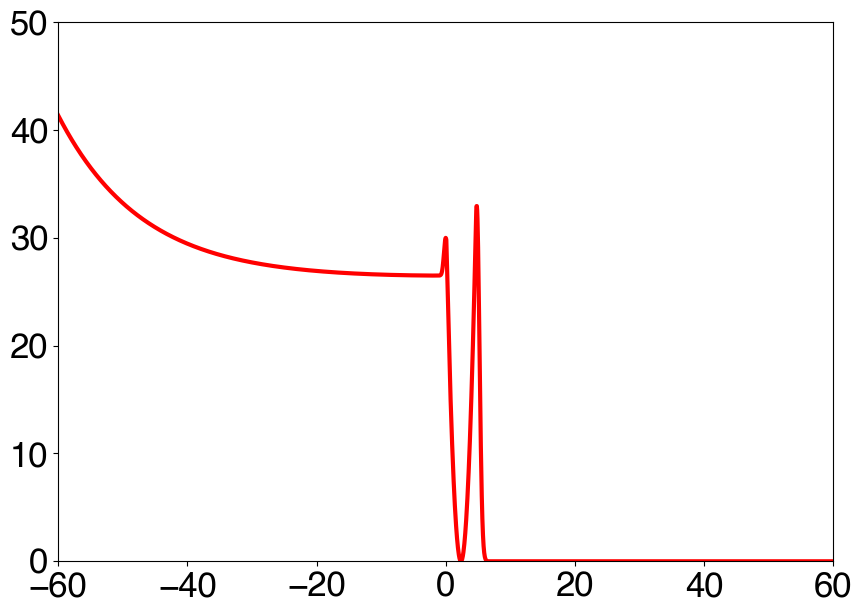

In [2]:
# Creates the triple well potential
# Position array in micrometers
number_of_atoms = 10 * 1.e3
position_start = -100.0
position_end = 3000.0

N = 2**16

a_s_factor = 0.1

transistor_position_mu_m = np.linspace(position_start, position_end, N)
transistor_position_m  = transistor_position_mu_m * 1e-6  # Convert to meters

# Configuration dictionary
config = {
    'source_bias_khz': 26.5,
    'sg_barrier_height_khz': 30.0,
    'gd_barrier_height_khz': 33.0,
    'gate_bias_khz': 0.0,
    'position_markers': {
        'position_start': position_start,      # Start of simulation region
        'source_well_start': -80.0,   # Start of source well
        'gate_well_start': 0.0,       # Start of gate well
        'gate_well_end': 4.8,         # End of gate well
        'drain_well_end': 2990.0,     # End of drain well
        'position_end': position_end        # End of simulation region
    },
    'smoothness_params': {
        'sigma_1': 0.6,      # Source-gate barrier width
        'sigma_2': 0.8,      # Source-gate transition width
        'sigma_3_gd': 0.6,   # Gate-drain barrier width
        'sigma_4_gd': 0.8    # Gate-drain transition width
    }
}
transistor_potential_khz, transistor_potential_joules = create_triple_well_potential(
    transistor_position_mu_m, 
    config
)
fig, ax = plt.subplots(figsize=(10, 7))
plt.plot(
    transistor_position_mu_m, transistor_potential_khz, color='r', linewidth=3)
plt.xlim(-60, 60)
plt.ylim(0, 50)
plt.show()

# Ground state in the source well

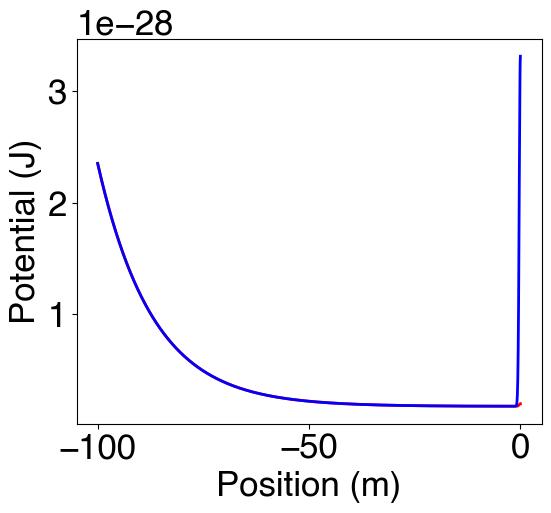

In [3]:
source_well_position_um, source_well_potential_joules = extract_source_well(transistor_position_m, transistor_potential_joules, config)

modified_source_well_joules = create_modified_source_well(source_well_position_um, config)

fig, ax = plt.subplots(figsize=(6, 5))
plt.plot(
    source_well_position_um, 
    source_well_potential_joules, 
    color='r', 
    linewidth=2
)
plt.plot(
     source_well_position_um, 
     modified_source_well_joules, 
     color='b', 
     linewidth=2
     )
# plt.xlim(-60, 60)
# plt.ylim(0, 35)
plt.xlabel('Position (m)')
plt.ylabel('Potential (J)')
plt.show()

In [4]:
source_solver, source_well_ground_state_dimless = run_imaginary_time_evolution(
     source_well_position_um * 1.e-6, 
     modified_source_well_joules, 
     number_of_atoms,
     time_step_s = 1e-6,
     max_time_s = 0.1, a_s_factor = a_s_factor)

Time =  -1e-06j s | Iteration =  0
Time =  -2e-06j s | Iteration =  1
Time =  -3e-06j s | Iteration =  2
Time =  -4e-06j s | Iteration =  3
Time =  -4.9999999999999996e-06j s | Iteration =  4
Time =  -6e-06j s | Iteration =  5
Time =  -7e-06j s | Iteration =  6
Time =  -8e-06j s | Iteration =  7
Time =  -9e-06j s | Iteration =  8
Time =  -9.999999999999999e-06j s | Iteration =  9
Time =  -1.1e-05j s | Iteration =  10
Time =  -1.2e-05j s | Iteration =  11
Time =  -1.3000000000000001e-05j s | Iteration =  12
Time =  -1.4e-05j s | Iteration =  13
Time =  -1.5e-05j s | Iteration =  14
Time =  -1.6e-05j s | Iteration =  15
Time =  -1.7e-05j s | Iteration =  16
Time =  -1.8e-05j s | Iteration =  17
Time =  -1.8999999999999998e-05j s | Iteration =  18
Time =  -1.9999999999999998e-05j s | Iteration =  19
Time =  -2.1e-05j s | Iteration =  20
Time =  -2.2e-05j s | Iteration =  21
Time =  -2.2999999999999997e-05j s | Iteration =  22
Time =  -2.4e-05j s | Iteration =  23
Time =  -2.5e-05j s | Ite

In [5]:
KE = source_solver.get_kinetic_energy()
PE = source_solver.get_total_potential_energy()
print('Ratio of kinetic to potential energy:', KE[0] / PE[0])

Ratio of kinetic to potential energy: 0.00013284885963737273


In [6]:
def array_chemical_potential(psi, l_0):
     # V_{ext} + 2 * h_bar * omega_r * a_s * N * |psi|^2
     return (modified_source_well_joules + 2 * H_BAR * source_solver.omega_r * source_solver.a_s * number_of_atoms * np.abs(psi / np.sqrt(l_0))**2)

array_mu = array_chemical_potential(source_well_ground_state_dimless, source_solver.l_0).real
print('Chemical potential at the center of the source well:', array_mu[len(array_mu)//2])

Chemical potential at the center of the source well: 2.2015460205386786e-29


In [7]:
mu_J, mu_khz = source_solver.get_chemical_potential(source_well_ground_state_dimless)
print(f'Chemical potential: {mu_khz:.2f} kHz ({mu_J:.2e} J)')

Chemical potential: 30.36 kHz (2.01e-29 J)


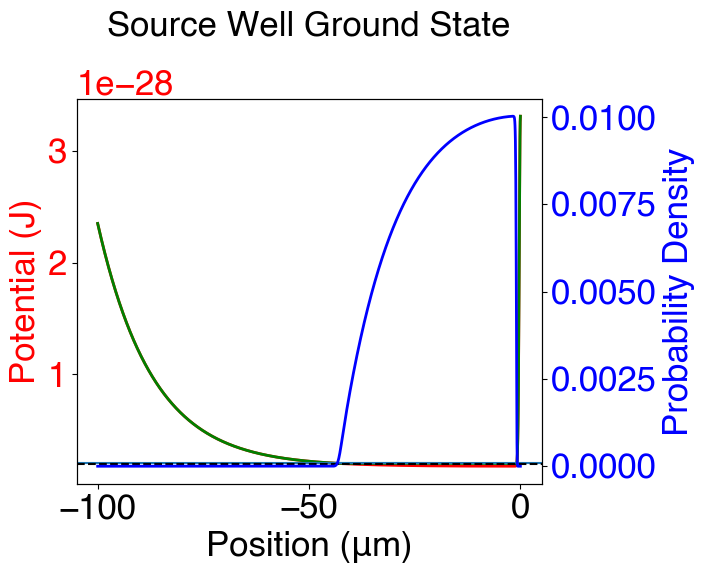

In [8]:
fig, ax1 = plt.subplots(figsize=(6, 5))

# Plot modified source well potential on left y-axis
ax1.plot(source_well_position_um, modified_source_well_joules, 'r', linewidth=2, label='Modified Source Well')
ax1.plot(source_well_position_um, array_mu, 'g', linewidth=2, label='Chemical Potential')
ax1.axhline(y = mu_J)
ax1.axhline(y = 30 * 1000 * H_BAR * 2 * np.pi, color='k', linestyle='--', label='SG Barrier Height')
ax1.set_xlabel('Position (μm)')
ax1.set_ylabel('Potential (J)', color='r')
ax1.tick_params(axis='y', labelcolor='r')

# Create second y-axis and plot ground state wavefunction
ax2 = ax1.twinx()
ax2.plot(source_well_position_um, np.abs(source_well_ground_state_dimless)**2, 'b', linewidth=2, label='Ground State')
ax2.set_ylabel('Probability Density', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# Add title and show plot
plt.title('Source Well Ground State')
plt.show()

In [9]:
# omega_l = 2 * np.pi * 1178
# omega_r = 10 * 2 * np.pi * 1178
# number_of_atoms = 10 * 1.e3
# a_s = 5.186 * 1.e-9
# M = 1.419e-25  # Mass of rubidium
# l_0 = np.sqrt(H_BAR / (M * omega_l))
# 2 * omega_r * a_s * number_of_atoms / (omega_l * l_0)

# Real time evolution

In [ ]:
# Put the initial ground state in the source well of the transistor.
psi_initial_for_full_potential_dimless = source_well_ground_state_dimless
while len(psi_initial_for_full_potential_dimless) < len(transistor_position_m):
    psi_initial_for_full_potential_dimless = np.hstack((psi_initial_for_full_potential_dimless, np.array([0])))

time_step_s = 10**(-6) # In seconds unit.
tmax = 200*1.e-3 # In seconds unit.

time_lst = list(np.arange(0.0, tmax, time_step_s))

# Create and run solver
solver = GrossPitaevskiiSolver(
     time_step_s,
     tmax,
     transistor_position_m,
     transistor_potential_joules,
     number_of_atoms,
     psi_initial_for_full_potential_dimless,  # Start with default Gaussian
     a_s_factor
)

time_evolved_wavefunction = solver.solve(snapshots_times_s = time_lst)

Time =  1e-06 s | Iteration =  0
Time =  2e-06 s | Iteration =  1
Time =  3e-06 s | Iteration =  2
Time =  4e-06 s | Iteration =  3
Time =  4.9999999999999996e-06 s | Iteration =  4
Time =  6e-06 s | Iteration =  5
Time =  7e-06 s | Iteration =  6
Time =  8e-06 s | Iteration =  7
Time =  9e-06 s | Iteration =  8
Time =  9.999999999999999e-06 s | Iteration =  9
Time =  1.1e-05 s | Iteration =  10
Time =  1.2e-05 s | Iteration =  11
Time =  1.3000000000000001e-05 s | Iteration =  12
Time =  1.4e-05 s | Iteration =  13
Time =  1.5e-05 s | Iteration =  14
Time =  1.6e-05 s | Iteration =  15
Time =  1.7e-05 s | Iteration =  16
Time =  1.8e-05 s | Iteration =  17
Time =  1.8999999999999998e-05 s | Iteration =  18
Time =  1.9999999999999998e-05 s | Iteration =  19
Time =  2.1e-05 s | Iteration =  20
Time =  2.2e-05 s | Iteration =  21
Time =  2.2999999999999997e-05 s | Iteration =  22
Time =  2.4e-05 s | Iteration =  23
Time =  2.5e-05 s | Iteration =  24
Time =  2.6000000000000002e-05 s | It

# Fourier transform analysis

In [ ]:
# wavefunc_40um = np.array(time_evolved_wavefunction[1]['wavefunction_at_fixed_point'])

In [ ]:
# dt = time_lst[1] - time_lst[0]
# wavefunc_40um_zero_mean = wavefunc_40um - np.mean(wavefunc_40um)
# freqs = np.fft.fftfreq(len(wavefunc_40um_zero_mean), dt)
# fft_vals = np.fft.fft(np.abs(wavefunc_40um_zero_mean)**2)
# power_spectrum = np.abs(fft_vals)**2

In [ ]:
# plt.figure(figsize=(10, 7))
# plt.plot(2* np.pi * freqs, power_spectrum, 'b-')
# plt.title('Power Spectrum at x=40μm')
# plt.xlabel('Frequency (Hz)')
# plt.ylabel('Power')
# plt.xlim(0, 10000)
# #plt.ylim(0, 100)
# plt.show()

# BEC analysis

In [ ]:
import numpy as np
from math import factorial, sqrt, pi, exp
from scipy.special import hermite
import os

def harmonic_oscillator_wavefunction(n, x, m, omega):
     # Characteristic length scale
     x0 = sqrt((1.0545606529268985e-34) / (m * omega))
     # Hermite polynomial
     Hn = hermite(n)
     # Normalization
     norm = 1.0 / (sqrt(2**n * factorial(n)) * (pi**0.25) * (x0**0.5))
     # Wavefunction
     return norm * np.exp(-0.5 * (x / x0)**2) * Hn(x / x0)

"""
To calculate the occupancy of each energy level the time evolved wavefunction can be projected onto the stationary harmonic oscillator wavefunctions.
This is done by integrating the product of the time-evolved wavefunction and the stationary wavefunction over the entire position space.
The occupancy for each level n is given by:
occupancy_n = |∫ ψ_n*(x) ψ(t,x) dx|^2
"""

def calculate_occupancy(time_evolved_wavefunction, transistor_position_m, m, omega):
     occupancy = []
     for n in range(24):  # Calculate occupancy for the first 24 energy levels
          wavefunction_n = harmonic_oscillator_wavefunction(n, transistor_position_m, m, omega)
          # Compute the projection coefficient c_n = ∫ ψ_n*(x) ψ(t,x) dx
          coeff = np.trapezoid(np.conj(wavefunction_n) * time_evolved_wavefunction, transistor_position_m)
          occupancy.append(np.abs(coeff)**2)
     return occupancy

# Loading the wavefunction at each time step
occupancy_list = []
number_of_iterations = [i for i in range(0, 199000, 1000)]  # Adjust the range as needed
M = 1.419e-25  # Mass of rubidium
omega_l = 2 * np.pi * 1178

path = '/Users/sasankadowarah/atomtronics/triple-well-transistor/modular/data/'
os.chdir(path)

for iteration in number_of_iterations:
     psi_t = np.load('psi_t_' + str(iteration) + '.npy')
     print('Normalization check for iteration', iteration, ':',
          np.sum(np.abs(psi_t)**2 * (transistor_position_m[1] - transistor_position_m[0])))
     occupancy = calculate_occupancy(psi_t, transistor_position_m, M, omega_l)
     occupancy_list.append(occupancy)

In [ ]:
# Calculate the spatial integral of |ψ|^2 in the gate well region
gate_start = config['position_markers']['gate_well_start']
gate_end = config['position_markers']['gate_well_end']

# Find indices corresponding to gate well region
gate_indices = np.where((transistor_position_mu_m >= gate_start) & 
                            (transistor_position_mu_m <= gate_end))[0]

# Get dx for integration
dx = transistor_position_m[1] - transistor_position_m[0]

# Calculate atom numbers in gate well at each time step
gate_atom_numbers = []
for i in range(0, len(time_lst)):
     if i % 1000 == 0:  # Load wavefunction every 1000 steps
          if i == 200000:
               pass
          else:
               psi_t = np.load(f'{path}psi_t_{i}.npy')
               # Calculate number of atoms in gate well
               gate_atoms = number_of_atoms * np.sum(np.abs(psi_t[gate_indices])**2) * dx
               gate_atom_numbers.append(gate_atoms)

# Plot results
plt.figure(figsize=(10, 7))
plt.plot(number_of_iterations, gate_atom_numbers[:-1])
plt.xlabel('Time Step')
plt.ylabel('Number of Atoms in Gate Well')
plt.title('Gate Well Population vs Time')
plt.show()

In [ ]:
cmap = plt.get_cmap('jet', len(number_of_iterations))  # Get a colormap with enough colors

fig, ax = plt.subplots(figsize=(10, 7))  # Create a figure and an axes

# Use len(occupancy) instead of len(occupancy[0])
levels_to_plot = range(len(occupancy))

for level in levels_to_plot:
     level_occupancy = number_of_atoms * np.array([occ[level] for occ in occupancy_list])
     color = cmap(level % cmap.N)
     if level in [0, 22, 23]:
          ax.plot(number_of_iterations, level_occupancy, color=color, label=f'{level}')
     else:
          ax.plot(number_of_iterations, level_occupancy, color=color)

ax.set_xlabel('Iteration')
ax.set_ylabel('Occupancy')
ax.set_title('Occupancy of Energy Levels vs. Iteration')
ax.legend(loc='upper right', title='Energy Level')
plt.show()

In [ ]:
plt.figure(figsize=(10, 7))

# Plot occupancy for states 0, 22, and 23
states_to_plot = [0, 22, 23]
labels = [f'State {n}' for n in states_to_plot]

for i, state in enumerate(states_to_plot):
     occupancy_values = number_of_atoms * np.array([occ[state] for occ in occupancy_list])
     plt.plot(number_of_iterations, occupancy_values, label=labels[i], linewidth=2)

plt.xlabel('Iteration')
plt.ylabel('Occupancy') 
plt.title('Time Evolution of Selected Energy States')
plt.legend()
plt.show()

In [ ]:
# Numerical eigenstates for the gate well
import scipy.linalg
# Define gate region indices and arrays
gate_indices = np.where((transistor_position_mu_m >= config['position_markers']['gate_well_start']) & (transistor_position_mu_m <= config['position_markers']['gate_well_end']))[0]
x_gate = transistor_position_m[gate_indices]
V_gate = transistor_potential_joules[gate_indices]
# Kinetic energy operator via finite difference
dx = x_gate[1] - x_gate[0]
N_gate = len(x_gate)
# Construct second derivative matrix
off = np.ones(N_gate-1)
T = (-H_BAR**2/(2*M)) * (np.diag(off,1) -2*np.eye(N_gate) + np.diag(off,-1)) / dx**2
# Hamiltonian and diagonalization
H_gate = T + np.diag(V_gate)
eigenvals, eigenstates = scipy.linalg.eigh(H_gate)

def calculate_occupancy(time_evolved_wavefunction, eigenstates):
    """
    Project time-evolved psi onto numerical eigenstates of gate well.
    """
    psi_gate = time_evolved_wavefunction[gate_indices]
    occupancy = []
    for n in range(len(eigenvals)):
        coeff = np.trapz(np.conj(eigenstates[:,n]) * psi_gate, x_gate)
        occupancy.append(np.abs(coeff)**2)
    return occupancy